# get the document

2020 Dec 20, just using topic words produce awful results in k-means clustering, amazon and ebay are not even in the same cluster, because their topic words do not contain 'buy' or 'sell'.
So I decide now to use all the description of app (added across panels) for vectorization.

In [46]:
%matplotlib inline
%run -i '0_paths.py'
%run -i '4_natural_language_processing.py'
initial_panel = '201908'
doc_df = combine_descriptions_into_str(
    open_file_func=open_merged_df,
    initial_panel=initial_panel,
    text_column_name='description',
    panels_with_text=['202003','202004','202009','202010','202011'])
print(doc_df.shape)
doc_df.sample(n=10)




(11945, 1)


description_all_panels
com.addictinggames.teamdriftcats                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         

# TF-IDF

https://towardsdatascience.com/how-to-cluster-in-high-dimensions-4ef693bacc6

curse of high dimensionality, need to set max_feature to restrict the number of columns in tf-idf matrix.

https://blog.exploratory.io/demystifying-text-analytics-part-4-dimensionality-reduction-and-clustering-in-r-cbc8c90e0b14

As you can imagine, when you have real-world documents the number of the dimensions would increase dramatically like a few thousand because the number of the dimensions equals to the number of unique terms in the entire set of documents.
Another thing you would notice by looking at the above table is that there are many cells that are left empty because all of the terms don’t necessarily exist in all the documents. We call this type of data ‘sparse’ data or ‘sparse matrix’.
Calculating the distance among all the documents from this type of high-dimensional and sparse data with algorithms like ‘K-means’ would have a problem called ‘Curse of dimensionality’.

In [47]:
# tfidf transformation
%run -i '4_natural_language_processing.py'
pipe = Pipeline(steps = [('tfidf',
                            TfidfVectorizer(
                            stop_words='english',
                            strip_accents='unicode',
                            max_features=2000))])
matrix = pipe.fit_transform(doc_df['description_all_panels'])
print(type(matrix))
# transform the matrix to matrix dataframe
matrix_df = pd.DataFrame(matrix.toarray(),
                         columns=pipe['tfidf'].get_feature_names())
matrix_df['app_ids'] = doc_df.index.tolist()
matrix_df.set_index('app_ids', inplace=True)
matrix_df


<class 'scipy.sparse.csr.csr_matrix'>


000        10  \
app_ids                                                                      
com.canva.editor                                        0.018206  0.000000   
jp.ne.ibis.ibispaintx.app                               0.000000  0.000000   
com.adobe.spark.post                                    0.000000  0.000000   
com.sec.penup                                           0.000000  0.000000   
com.doodle.master.draw.glow.art                         0.000000  0.000000   
...                                                          ...       ...   
com.sparklingsocietytycoon.paradisecityislandsim        0.000000  0.000000   
com.budgestudios.MyLittlePonyHarmonyQuest               0.000000  0.000000   
com.budgestudios.googleplay.MyLittlePonyRainbowRunners  0.000000  0.000000   
letsfarm.com.playday                                    0.000000  0.000000   
com.sparklingsociety.cityisland4                        0.000000  0.025314   

                                                             100  1000   11  \
app_ids                                                                       
com.canva.editor                                        0.000000   0.0  0.0   
jp.ne.ibis.ibispaintx.app                               0.000000   0.0  0.0   
com.adobe.spark.post                                    0.000000   0.0  0.0   
com.sec.penup                                           0.000000   0.0  0.0   
com.doodle.master.draw.glow.art                         0.000000   0.0  0.0   
...                                                          ...   ...  ...   
com.sparklingsocietytycoon.paradisecityislandsim        0.032239   0.0  0.0   
com.budgestudios.MyLittlePonyHarmonyQuest               0.000000   0.0  0.0   
com.budgestudios.googleplay.MyLittlePonyRainbowRunners  0.000000   0.0  0.0   
letsfarm.com.playday                                    0.144731   0.0  0.0   
com.sparklingsociety.cityisland4                        0.000000   0.0  0.0   

                                                         12   13   14   15  \
app_ids                                                                      
com.canva.editor                                        0.0  0.0  0.0  0.0   
jp.ne.ibis.ibispaintx.app                               0.0  0.0  0.0  0.0   
com.adobe.spark.post                                    0.0  0.0  0.0  0.0   
com.sec.penup                                           0.0  0.0  0.0  0.0   
com.doodle.master.draw.glow.art                         0.0  0.0  0.0  0.0   
...                                                     ...  ...  ...  ...   
com.sparklingsocietytycoon.paradisecityislandsim        0.0  0.0  0.0  0.0   
com.budgestudios.MyLittlePonyHarmonyQuest               0.0  0.0  0.0  0.0   
com.budgestudios.googleplay.MyLittlePonyRainbowRunners  0.0  0.0  0.0  0.0   
letsfarm.com.playday                                    0.0  0.0  0.0  0.0   
com.sparklingsociety.cityisland4                        0.0  0.0  0.0  0.0   

                                                        150   16   18   20  \
app_ids                                                                      
com.canva.editor                                        0.0  0.0  0.0  0.0   
jp.ne.ibis.ibispaintx.app                               0.0  0.0  0.0  0.0   
com.adobe.spark.post                                    0.0  0.0  0.0  0.0   
com.sec.penup                                           0.0  0.0  0.0  0.0   
com.doodle.master.draw.glow.art                         0.0  0.0  0.0  0.0   
...                                                     ...  ...  ...  ...   
com.sparklingsocietytycoon.paradisecityislandsim        0.0  0.0  0.0  0.0   
com.budgestudios.MyLittlePonyHarmonyQuest               0.0  0.0  0.0  0.0   
com.budgestudios.googleplay.MyLittlePonyRainbowRunners  0.0  0.0  0.0  0.0   
letsfarm.com.playday                                    0.0  0.0  0.0  0.0   
com.sparklingsociety.cityisland4                        0.0  0.0  0

In [50]:
# check whether the index of matrix_df matches to its topic words as the original doc_df
print('this is doc_df shape, app id and topic words:')
print(matrix_df.shape)
n = doc_df.sample(n=1).index.to_native_types()
print(n)
print(doc_df.loc[n, 'description_all_panels'])
print()
print('first slice out matrix_df with the index app id and transpose it')
tfidf = matrix_df.loc[n].T
print(tfidf.shape)
print()
print('then filter the column with only none-zero terms, see if this matches to doc_df')
none_zero_tfidf = tfidf.loc[(tfidf != 0).all(axis=1), :] # filter out rows containing 0s
print(none_zero_tfidf.shape)
print(none_zero_tfidf.dtypes)
print(none_zero_tfidf)
# it shows matrix_df is correct with its index (app-ids).

this is doc_df shape, app id and topic words:
(11945, 2000)
['com.lego.legohouse']
com.lego.legohouse    b'Prepare yourself for a visit to LEGO House with the free LEGO House App and get a playful introduction to what you can experience in LEGO House in Billund, Denmark.\r\n\r\nYou can use The LEGO House App before your visit to explore the cool experiences inside LEGO House. You can use the LEGO House App after your visit to download the content you create during the day.\r\n\r\nThe LEGO House App is a playful introduction to LEGO House for kids. Build cool LEGO Models for each room and explore which LEGO Minifigure belongs to each room. For every room you unlock you will get a sneak peek into how it looks in the real LEGO House. Get them all  and the LEGO Minifigures will be super happy.  Find out which experiences you like and start planning your trip today.  \r\n\r\nRead more about LEGO House at: http://LEGOHouse.com\r\n\r\nFor app support contact LEGO Consumer Service. \r\nFor con

# SVD
https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.TruncatedSVD.html

Dimensionality reduction using truncated SVD (aka LSA).

This transformer performs linear dimensionality reduction by means of truncated singular value decomposition (SVD). Contrary to PCA, this estimator does not center the data before computing the singular value decomposition. This means it can work with sparse matrices efficiently.

## choose optimal number of components (dimensions)


Number of components = 4 and explained variance = 0.035366067691772654
Number of components = 10 and explained variance = 0.07483418427333773
Number of components = 15 and explained variance = 0.0997566863446096
Number of components = 20 and explained variance = 0.12052965983378752
Number of components = 50 and explained variance = 0.20551981728106
Number of components = 100 and explained variance = 0.2957523276522621
Number of components = 150 and explained variance = 0.36159459054893006
Number of components = 200 and explained variance = 0.415296522874156
Number of components = 500 and explained variance = 0.6300918805192486
Number of components = 700 and explained variance = 0.7248560297788377
Number of components = 800 and explained variance = 0.7640430982548553
Number of components = 900 and explained variance = 0.7989459703177029
Number of components = 1000 and explained variance = 0.8299889039659811
Number of components = 1100 and explained variance = 0.8578120127722318
Number 

100%|██████████| 22/22 [01:41<00:00,  4.60s/it]


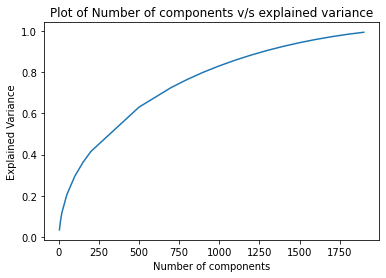

In [51]:
# skip the block if you have decided which n_comp to use
%run -i '4_natural_language_processing.py'
# https://medium.com/swlh/truncated-singular-value-decomposition-svd-using-amazon-food-reviews-891d97af5d8d
n_comp = [4,10,15,20,50,100,150,200,500,700,800,900,1000,1100,1200,1300,1400,1500,1600,1700,1800,1900] # list containing different values of components
explained = [] # explained variance ratio for each component of Truncated SVD
for x in tqdm(n_comp):
    svd = TruncatedSVD(n_components=x)
    svd.fit(matrix)
    explained.append(svd.explained_variance_ratio_.sum())
    print("Number of components = %r and explained variance = %r"%(x,svd.explained_variance_ratio_.sum()))
plt.plot(n_comp, explained)
plt.xlabel('Number of components')
plt.ylabel("Explained Variance")
plt.title("Plot of Number of components v/s explained variance")
plt.show()

## transform tf-idf using truncated svd
From the graph above, choose 500
https://subscription.packtpub.com/book/big_data_and_business_intelligence/9781783989485/1/ch01lvl1sec21/using-truncated-svd-to-reduce-dimensionality

In [52]:
# I need to look at the source code in order to add app-id index for the transformed svd matrix
svd = TruncatedSVD(n_components=1300, random_state=50) # specify random state for the results to be replicable
matrix_transformed = svd.fit_transform(matrix) # I tried to substitute matrix_df here, and got exactly same output np array as using matrix
print(matrix_transformed.shape)
print(matrix_transformed)
# transpose the matrix for fuzzy c means
matrix_transformed_T = matrix_transformed.transpose()
print(matrix_transformed_T.shape)
print(matrix_transformed_T)

(11945, 1300)
[[ 0.18864611 -0.07700519 -0.2165169  ...  0.0062276  -0.00464864
  -0.01262033]
 [ 0.20757452 -0.10565896 -0.05260269 ... -0.01956266 -0.02071222
  -0.00778428]
 [ 0.25662646 -0.08238114 -0.17178859 ... -0.00894086 -0.00146232
  -0.02234056]
 ...
 [ 0.26178665 -0.03965136  0.02190365 ...  0.00486818  0.00407132
   0.00373392]
 [ 0.24188783  0.15605985  0.02608728 ...  0.01593084  0.00536266
   0.03351551]
 [ 0.21577632  0.19311287  0.04732368 ... -0.00337679  0.01044158
   0.01167764]]
(1300, 11945)
[[ 0.18864611  0.20757452  0.25662646 ...  0.26178665  0.24188783
   0.21577632]
 [-0.07700519 -0.10565896 -0.08238114 ... -0.03965136  0.15605985
   0.19311287]
 [-0.2165169  -0.05260269 -0.17178859 ...  0.02190365  0.02608728
   0.04732368]
 ...
 [ 0.0062276  -0.01956266 -0.00894086 ...  0.00486818  0.01593084
  -0.00337679]
 [-0.00464864 -0.02071222 -0.00146232 ...  0.00407132  0.00536266
   0.01044158]
 [-0.01262033 -0.00778428 -0.02234056 ...  0.00373392  0.03351551
   0

In [53]:
# assume the order of index does not change, append the matrix_df index to matrix_transformed and matrix_transformed_T
matrix_transformed_df = pd.DataFrame(matrix_transformed) # do not need to assign column names because those do not correspond to each topic words (they have been transformed)
matrix_transformed_df['app_ids'] = doc_df.index.tolist()
matrix_transformed_df.set_index('app_ids', inplace=True)
matrix_transformed_df

0         1     \
app_ids                                                                      
com.canva.editor                                        0.188646 -0.077005   
jp.ne.ibis.ibispaintx.app                               0.207575 -0.105659   
com.adobe.spark.post                                    0.256626 -0.082381   
com.sec.penup                                           0.179560 -0.091169   
com.doodle.master.draw.glow.art                         0.127215  0.097211   
...                                                          ...       ...   
com.sparklingsocietytycoon.paradisecityislandsim        0.173221  0.203505   
com.budgestudios.MyLittlePonyHarmonyQuest               0.259229 -0.028392   
com.budgestudios.googleplay.MyLittlePonyRainbowRunners  0.261787 -0.039651   
letsfarm.com.playday                                    0.241888  0.156060   
com.sparklingsociety.cityisland4                        0.215776  0.193113   

                                                            2         3     \
app_ids                                                                      
com.canva.editor                                       -0.216517 -0.023303   
jp.ne.ibis.ibispaintx.app                              -0.052603  0.015388   
com.adobe.spark.post                                   -0.171789 -0.022137   
com.sec.penup                                          -0.063878 -0.001452   
com.doodle.master.draw.glow.art                        -0.060729 -0.056613   
...                                                          ...       ...   
com.sparklingsocietytycoon.paradisecityislandsim        0.040218 -0.046639   
com.budgestudios.MyLittlePonyHarmonyQuest               0.026145  0.040788   
com.budgestudios.googleplay.MyLittlePonyRainbowRunners  0.021904  0.022918   
letsfarm.com.playday                                    0.026087  0.065778   
com.sparklingsociety.cityisland4                        0.047324 -0.033662   

                                                            4         5     \
app_ids                                                                      
com.canva.editor                                        0.185174 -0.008868   
jp.ne.ibis.ibispaintx.app                               0.006006  0.012729   
com.adobe.spark.post                                    0.111589 -0.014037   
com.sec.penup                                           0.014998  0.010880   
com.doodle.master.draw.glow.art                         0.069115 -0.017253   
...                                                          ...       ...   
com.sparklingsocietytycoon.paradisecityislandsim       -0.010384 -0.027816   
com.budgestudios.MyLittlePonyHarmonyQuest              -0.114111 -0.051291   
com.budgestudios.googleplay.MyLittlePonyRainbowRunners -0.084261 -0.085532   
letsfarm.com.playday                                   -0.016331 -0.019801   
com.sparklingsociety.cityisland4                       -0.017669 -0.045573   

                                                            6         7     \
app_ids                                                                      
com.canva.editor                                        0.084488  0.102598   
jp.ne.ibis.ibispaintx.app                               0.008138  0.011100   
com.adobe.spark.post                                    0.096376  0.085952   
com.sec.penup                                           0.017344 -0.007276   
com.doodle.master.draw.glow.art                         0.031101  0.050355   
...                                                          ...       ...   
com.sparklingsocietytycoon.paradisecityislandsim       -0.020894  0.071675   
com.budgestudios.MyLittlePonyHarmonyQuest               0.115827 -0.089648   
com.budgestudios.googleplay.MyLittlePonyRainbowRunners  0.057342 -0.056328   
letsfarm.com.playday                                    0.031402  0.003047   
com.sparklingsociety.cityisland4                       -0.002748  0.106250   



In [54]:
matrix_transformed_T_df = pd.DataFrame(matrix_transformed_T,
                                       columns = doc_df.index.tolist())
matrix_transformed_T_df

,com.canva.editor,jp.ne.ibis.ibispaintx.app,com.adobe.spark.post,com.sec.penup,com.doodle.master.draw.glow.art,com.vblast.flipaclip,com.appxstudio.smokearteffect,com.eyewind.paperone,com.magicposernew,com.redberry.glitterlips,pl.planmieszkania.android,com.adobe.creativeapps.sketch,com.brakefield.painter,anime.face.changer.cartoon.photo_editor,com.medibang.android.paint.tablet,com.axis.drawingdesk.v3,com.weddingdress.coloringbookms,truefunapps.furniture,com.ayogamez.sketchcartoon,com.cross.stitch.color.by.number,truefunapps.notebook,com.Beautytools.coloringbookms,air.com.KalromSystems.SandDrawLite,zonek.design.paintbynumbers,com.blondeagames.art.coloring.book,com.ticticgames.glitterdress,com.madcat.easyposer,com.wildDevLab.threeDLogoMaker,com.beauty.coloringdodo,rose.gold.wallpaper,com.creative.colorfit.mandala.coloring.book,com.picsart.animate,app.over.editor,com.beansprites.rainbowglittercoloringbookFREE,com.beansprites.coloringbookmermaidsFREE,com.bytestorm.artflow,udenity.draw.animals,truefunapps.minioffice,desktop.colorbynumbers.pixelmoon,com.colorbynumber.unicorn.pixel.art.panda.draw.paintbynumber,com.sweefitstudios.drawgraffiti,co.pamobile.pokemon.cardmaker,com.IngressStudio.xxxtentacion,com.PixelStudio,kenmaz.net.animemaker,com.continuum.flyermaker,com.paintart.artworkbynumbers,com.iboattech.avatar.cute,aesthetic.wallpaper,com.tattoo.maker.design.app,com.creative.Learn.to.draw.flowers,anime.face.maker.cartoon.photo_filters,com.bingzer.android.stickdraw,truefunapps.dress,com.nra.flyermaker,com.articoapps.wedraw,noirelabs.textgram,com.birthday.birthdayinvitation,splendid.postermaker.designer,com.kidspaint.kaushalmehra.drawingfun,com.objectremover.touchretouch,com.socialmedia.socialmediapostmaker,com.jdpapps.textt1,com.mark.calligraphy,ps.battle.royale,me.tomhicks.asketchaday,ice.lenor.nicewordplacer.app,com.skylapcity.photocollage,com.beautywall.superheroes.wallpaper,com.samsung.android.sdrawing,com.sorincovor.pigments,com.phone.launcher.lite,com.brakefield.idfree,provapi.wallpaper.xxxtentacion,com.abcgamescom.generator.ides.drawing,udenity.draw.weapons,com.vehicledrawingbook.android,com.e3games.numbercoloring.pixelart,com.ova.studio.anime.wallpaper,com.tophatch.concepts,com.ouhmaexe.wallwovers,anime.smartroom.com.drawanime,osmandroid.a8bitpainter,com.wallpapers.anime.song.xxxtentaction,com.iboattech.avatar.factory,app.poster.maker.postermaker.flyer.designer,com.optimumbrewlab.invitationcardmaker,com.devloperpro.creepypastawallpaper,com.piupiuapps.coloringmandala3,com.fashion.tattoo.name.my.photo.editor,com.camera.sketch.camera.pencil,com.HousePlanDesigns.sitd212,com.figuromo.colorminiscollections,truefunapps.food,com.teazel.coloring,com.sweefitstudios.drawgraffiticharacters,com.laura.fashiondesign,com.ioslauncher.newest,com.iphone.xs.launcher.ios12.theme,com.vn.goforoid.wallpaper.galaxy,com.google.android.projection.gearhead,com.cars.android,com.aa.extreme.city.gt.car.stunts,com.carmax.carmax,com.autolist.autolist,com.paybyphone,tat.example.ildar.seer,com.destotechgames.animal.rescue.atv.trolly,com.carvana.carvana,com.gs360.counter.terrorist.shooting.games,com.driveus.dmvapp,com.ggs.offroadjeep.mountaindriving.racingsimulator.games,com.fair.fairapp,com.coco.dmv,com.shell.sitibv.motorist.america,com.impp.city.traindriver.simulator,dto.ee.dmv.genius,com.coco.cdl,com.gb.truckdriving.heavytruck.drivinggames.drivingsimulator,com.gzl.drivebus.parking.game,com.drivetime.MobileOnline,com.gpshopper.discounttire,com.rr.waterstunts.bikeracing.beachbike.motorbikegames,com.jimaapps.city.coach.bus.simulator.driving,com.autopten.cheapcarsforsale,com.ovz.carscanner,com.rcgames.megarampstunts,com.ramp.bike.impossible.bike.racing.stunt.games,com.gp.crazy.tricky.bike.stunt.drift,com.gameswing.impossibletracks.stuntdriving.simulator2,com.impp.construction.simulator.forklift,com.driveoctane.app,com.ifg.carrepair.carbuilder.garagesimulator.workshoprepair,com.szinteractive.TrafficRace,com.saritasa.micromechanic,com.impp.citytaxi.simulator.driv

# kmeans

## skip below if you have already chosen the optimal number of clusters

In [55]:
# https://medium.com/@MSalnikov/text-clustering-with-k-means-and-tf-idf-f099bcf95183
# https://pythonprogramminglanguage.com/kmeans-text-clustering/
# https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html
# 2018 Fall machine learning I Homework 5

# n_init: int, Number of time the k-means algorithm will be run with different
# centroid seeds. default=10
# ‘k-means++’ : selects initial cluster centers for k-mean clustering in a smart way
# to speed up convergence.
# random_state: int, RandomState instance, default=None
# Determines random number generation for centroid initialization.
# Use an int to make the randomness deterministic.
# max_iter: int, default=300
# Maximum number of iterations of the k-means algorithm for a single run.
# one iteration means you calculate the distance to initially assigned /
# previously calculated centroid, and update label

# https://scikit-learn.org/stable/modules/clustering.html
# Inertia can be recognized as a measure of how internally coherent clusters are. It suffers from various drawbacks:
#
# Inertia makes the assumption that clusters are convex and isotropic, which is not always the case. It responds poorly to elongated clusters, or manifolds with irregular shapes.
#
# Inertia is not a normalized metric: we just know that lower values are better and zero is optimal. But in very high-dimensional spaces, Euclidean distances tend to become inflated (this is an instance of the so-called “curse of dimensionality”). Running a dimensionality reduction algorithm such as Principal component analysis (PCA) prior to k-means clustering can alleviate this problem and speed up the computations.

%run -i '4_natural_language_processing.py'
wcss=[]
for i in tqdm(range(10,100)):
     kmeans = KMeans(n_clusters=i, init ='k-means++', random_state=0 )
     # the column of matrix (each unique word) is a feature
     # here we only fit, not predict because we want to find the optimal number of centers
     # through elbow method, and then use that for fit_predict command
     kmeans.fit(matrix_transformed)
     wcss.append(kmeans.inertia_)

 89%|████████▉ | 80/90 [21:06<04:21, 26.13s/it]Exception ignored in: 'sklearn.cluster._k_means_fast._relocate_empty_clusters_dense'
Traceback (most recent call last):
  File "<__array_function__ internals>", line 2, in where
KeyboardInterrupt: 
100%|██████████| 90/90 [25:40<00:00, 17.12s/it]


KeyboardInterrupt: 

<Figure size 432x288 with 0 Axes>

In [34]:
# save
initial_panel = '201908'
folder_name = initial_panel + '_PANEL_DF'
f_name = 'kmeans_tf_idf_10_101_centroids_inertia.pkl'
q = input_path / '__PANELS__' / folder_name / f_name
with open(q, 'wb') as f:
    pickle.dump(wcss, f)

## choose optimal number of clusters using elbow graph

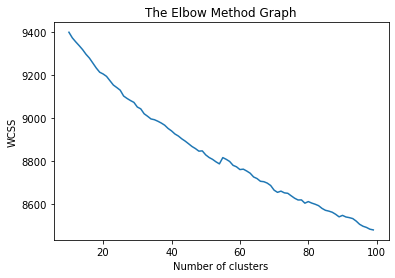

In [36]:
with open(q, 'rb') as f:
    wcss = pickle.load(f)
# https://medium.com/pursuitnotes/k-means-clustering-model-in-6-steps-with-python-35b532cfa8ad
plt.plot(range(10,100),wcss)
plt.title('The Elbow Method Graph')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()


## predict clusters for each app's description (10 topic words)
from above, choose n_clusters as 37 because as see the line drops sharply right before that.

In [56]:
kmeans = KMeans(n_clusters=70, init ='k-means++',random_state=0 )
y_kmeans = kmeans.fit_predict(matrix_transformed) # put matrix_transformed_df here would generate same result as put matrix_transformed
print(len(y_kmeans))
print(set(y_kmeans))

11945
{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69}


In [57]:
%run -i '4_natural_language_processing.py'
# attach app ids to each point and see which cluster they belong to
app_ids = matrix_transformed_df.index.tolist()
predicted_cluster_app_ids = merge_lists_to_dataframe(appid = app_ids,
                                                     cluster_label = y_kmeans,
                                                     type_of_cluster = 'k-means')
print(predicted_cluster_app_ids.shape)
predicted_cluster_app_ids


(11945, 1)


,k-means
app_id,
com.canva.editor,52
jp.ne.ibis.ibispaintx.app,9
com.adobe.spark.post,52
com.sec.penup,9
com.doodle.master.draw.glow.art,4
...,...
com.sparklingsocietytycoon.paradisecityislandsim,4
com.budgestudios.MyLittlePonyHarmonyQuest,5
com.budgestudios.googleplay.MyLittlePonyRainbowRunners,57


In [68]:
# open the original dataframe, and create a new column storing k-means labels
%run -i '4_natural_language_processing.py'
df2 = add_cluster_label_to_df(open_file_func = open_topic_df,
                              initial_panel = '201908',
                              merged_df = predicted_cluster_app_ids,
                              cluster_type='k-means')
df2.sample(n=1)

,description_201908,description_201912,description_202001,description_202003,description_202004,description_202009,description_202010,description_202011,combined_panels_description,topic_words,k-means
com.MedixBeauty2,[available],"[medixbeauty, app, professional, makeup, artist, makeup, enthusiast, develop, michelle, shaffer, founder, twinmedix, lead, expert, skincare, makeup, industry, medixbeauty, app, bring, elite, celebrity, makeup, artist, master, flawless, technique, step, step, easy, follow, tutorial, insider, tip, trick, need, help, build, thriving, career, beauty, industry, look, deep, fundamental, medixbeauty, change, way, experience, makeup, application, take, right, shoulder, artist, explain, exactly, apply, brilliant, look, use, worldwide, celebrity, artist, music, fashion, film, television, medixbeauty, develop, content, daily, basis, provide, relevant, trend, tutorial, know, love, makeup, want, try, new, look, want, build, library, technique, work, professional, medixbeauty, app, makeup, passion]","[medixbeauty, app, professional, makeup, artist, makeup, enthusiast, develop, michelle, shaffer, founder, twinmedix, lead, expert, skincare, makeup, industry, medixbeauty, app, bring, elite, celebrity, makeup, artist, master, flawless, technique, step, step, easy, follow, tutorial, insider, tip, trick, need, help, build, thriving, career, beauty, industry, look, deep, fundamental, medixbeauty, change, way, experience, makeup, application, take, right, shoulder, artist, explain, exactly, apply, brilliant, look, use, worldwide, celebrity, artist, music, fashion, film, television, medixbeauty, develop, content, daily, basis, provide, relevant, trend, tutorial, know, love, makeup, want, try, new, look, want, build, library, technique, work, professional, medixbeauty, app, makeup, passion]","[medixbeauty, app, professional, makeup, artist, makeup, enthusiast, develop, michelle, shaffer, founder, twinmedix, lead, expert, skincare, makeup, industry, medixbeauty, app, bring, elite, celebrity, makeup, artist, master, flawless, technique, step, step, easy, follow, tutorial, insider, tip, trick, need, help, build, thriving, career, beauty, industry, look, deep, fundamental, medixbeauty, change, way, experience, makeup, application, take, right, shoulder, artist, explain, exactly, apply, brilliant, look, use, worldwide, celebrity, artist, music, fashion, film, television, medixbeauty, develop, content, daily, basis, provide, relevant, trend, tutorial, know, love, makeup, want, try, new, look, want, build, library, technique, work, professional, medixbeauty, app, makeup, passion]","[medixbeauty, app, professional, makeup, artist, makeup, enthusiast, develop, michelle, shaffer, founder, twinmedix, lead, expert, skincare, makeup, industry, medixbeauty, app, bring, elite, celebrity, makeup, artist, master, flawless, technique, step, step, easy, follow, tutorial, insider, tip, trick, need, help, build, thriving, career, beauty, industry, look, deep, fundamental, medixbeauty, change, way, experience, makeup, application, take, right, shoulder, artist, explain, exactly, apply, brilliant, look, use, worldwide, celebrity, artist, music, fashion, film, television, medixbeauty, develop, content, daily, basis, provide, relevant, trend, tutorial, know, love, makeup, want, try, new, look, want, build, library, technique, work, professional, medixbeauty, app, makeup, passion]","[medixbeauty, app, professional, makeup, artist, makeup, enthusiast, develop, michelle, shaffer, founder, twinmedix, lead, expert, skincare, makeup, industry, medixbeauty, app, bring, elite, celebrity, makeup, artist, master, flawless, technique, step, step, easy, follow, tutorial, insider, tip, trick, need, help, build, thriving, career, beauty, industry, look, deep, fundamental, medixbeauty, change, way, experience, makeup, application, take, right, shoulder, artist, explain, exactly, apply, brilliant, look, use, worldwide, celebrity, artist, music, fashion, film, tele

## look at which apps are contained in each cluster (to check)

In [70]:
# filter column topic_words and k-means for the same cluster number, and manually check
%run -i '4_natural_language_processing.py'
df = select_cluster_labels(open_file_func=open_cluster_df,
                           cluster_type='k-means',
                           initial_panel = '201908',
                           cluster_label_value = 7)
print(df.shape)
df.sample(n=10) # even though some are about photo printing, but looks like they are about travel


(90, 2)


,combined_panels_description,k-means
com.seacloud.bc,"[baby, connect, comprehensive, baby, tracking, application, market, graphical, report, trend, chart, weekly, average, medicine, vaccine, timer, notification, email, .csv, export, easy, use, interface, unlimited, datum, allow, exchange, information, real, time, spouse, babysitter, nanny, daycare, are.\nbaby, connect, application, available, mobile, platform, web, application, synchronize, information, authorize, baby, connect, application, device, change, lose, phone, information, lose, connect, account, browser, phone.\n, \n""baby, connect, comprehensive, design, new, york, times\n, 5, family, fun, app, mom, connect, need, stress, anxiety, guilt, bay, app, truly, comprehensive, way, log, child\, daily, activity, \nyou, record, feeding, nursing, nap, diaper, milestone, pumping, babys, mood, temperature, kind, game, s, playing, gp, ...]",7
com.tutotoons.app.pandalubabybearcity.free,"[chubby, sweet, baby, panda, lu, take, trip, city, buy, grocery, shopping, mall, drink, coffee, shop, prepare, ice, cream, play, hide, seek, cut, baby, pet, \ndress, style, hair, ready, ton, city, adventure, baby, panda, lu, visit, carnival, fair, fun, carousel, funny, picture, spin, magic, wheel, grocery, store, pick, food, ready, sweet, treat, rush, coffee, shop, good, drink, town, mommy, panda, pandora, delicious, ice, cream, cone, clean, fountain, decorate, slide, invite, baby, bear, turtle, penguin, owl, parrot, play, hide, seek, \nenjoy, big, city, adventure, fluffy, baby, panda, lu, baby, pet, friends:\n, fun, carnival, ride, horse, carousel, cut, baby, panda, lu, \n, set, ...]",7
com.appquiz.baby.musical,"[educational, app, learn, musical, instruments.\nwhich, musical, instrument, baby, prefer?\nscene, different\nmusical, instrument, exciting, performance, cute, animals\ncultivate, train, baby\, mind, recognize, different, sound, learn, play, popular, musical, instrument, xylophone, piano, drums.\ndoe, baby, like, musical, rhythms?\na, special, interactive, model, rhythm, design, suit, baby\, needs.\nthis, app, fun, easy, learn, foster, baby\, musical, talent.\nall, child, need, simply, click, screen, musical, instrument, play, follow, clicks"".\nwe, care, education, care, fun.\nthere, dozen, background, song, listen, playing.\ninteractive, interesting, entertaining, child, games.\n-, focus, on\ninspiration\n, learning.\n-, focus, on\ncapacity, building\n, single, cognition.\n-, focus, on\nentertaining\n, spoon, feed, teaching.\ndevelope, specifically, preschooler, combine, main, concept, early, childhood, education, 3, 6, year, old, baby, cover, cognition, ...]",7
com.wachanga.babycare,"[app, handy, reliable, assistant, breastfeed, newborn, baby, track, breastfeeding, bottle, feeding, solid, food, feeding, milk, pumping, save, diaper, changing, sleep, period, result, baby, height, weight, measurements.\nwith, breastfeed, tracker, can:\n, track, feed, breast, baby, breast, feeding\n, track, bottle, feeding\n, fix, solid, food, feeding, food, amount\n, need, express, milk, fix, ml, oz, breast, pumped\n, fix, diaper, changing, note, wet, dirty, \n, know, diaper, change, day\n, record, bath, temperature, walk, medications\n, handy, breastfeed, timer, sleeping, timer, easy, stop, restart\n, baby, height, weight, measure, daily, easily, store, baby, diary.\n, add, reminder, event, periodic, easy, set\n, display, baby, nursing, sleep, timer, notification, bar, easy, access, ...]",7
com.tommo.tgpepp3,"[putt, putt, save, zoo, \nits, grand, opening, cartown, zoo, baby, animal, miss, putt, putt, pep, need, reunite, little, one, parent, zoo, gate, open, way, will, swing, river, play, hockey, polar, pear, build, bridge, iceberg, dance, penguin, experience, adventure.\nfille, captivate, challenge, new, friend, adventure, perfect, child, age.\nfeatures:\n, help, putt, putt, track, need, find, miss, baby, animals.\n, simple, touchscreen, navigation, make, easy, guide, putt, putt, adventure.\n, fun, music

In [72]:
# look at amazon, and see which apps are in their cluster
%run -i '4_natural_language_processing.py'
df = see_apps_from_the_same_cluster_of_a_given_app(open_file_func=open_cluster_df,
                                                   cluster_type='k-means',
                                                   initial_panel='201908',
                                                   given_app_id='com.amazon.mShop.android.shopping')
print(df.shape)
df.sample(n=10)


com.amazon.mShop.android.shopping has cluster label 25
(224, 2)


,combined_panels_description,k-means
com.buildapp,"[good, selection, home, improvement, fingertip, download, free, app, shop, late, style, unique, product, finish, will, not, find, else.\nawards:\nbest, augment, reality, app, appy, award, 2018\nbest, home, lifestyle, app, appy, award, 2018\ngold, winner, best, ar, vr, app, smartie, 2018\nthe, app, make, easy, connect, live, project, expert, free, advice, help, find, product, need, project, success, will, exclusive, saving, brand, notification, clearance, liquidation, item, instant, price, drop, alert, track, cart, order, invoice, date, notification, shipment, shop, home, improvement, essential, easy, will, great, price, product, match, unique, style, fast, free, standard, shipping, order, 49.\nin, home, preview, augment, reality, \nvisualize, home, improvement, product, buy, incredibly, detailed, ...]",25
com.wyndhamhotelgroup.wyndhamrewards,"[wyndham, hotels, resort, inc.\nbook, stay, track, point, offersall, go.\njoin, wyndham, reward, earn, redeem, point, free, night, thousand, hotel, vacation, club, resort, vacation, rental, worldwide.\n-\tjoin, program, free, book, exclusive, member, rate, register, promotion, directly, app.\n-\tbook, stay, 9,000, hotel, 20, trust, brand, earn, 10, point, dollar, 1,000, pointswhichever, morefor, qualified, stay.\n-\ttrack, point, redeem, free, discount, night, book, free, night, start, 7,500, point, discount, night, start, 1,500, points.\n-\tif, drive, need, hand, free, let, reservation, agent, book, stay, like, have, travel, agent, pocket.\n-\tyou, upcoming, stay, view, digital, member, card, modify, cancel, reservation, choose, receive, text, message, reminder, reservation, details.\nabout, wyndham, rewards\nwyndham, rewards, kind, hotel, ...]",25
com.rucksack.barcodescannerforebay,"[find, amazing, deal, save, money, store, item, barcode, reader, ebay, \nwith, barcode, scanner, ebay, will, able, access, compare, price, rating, review, product, store, find, deal, discount, online, smart, purchase, save, hard, earn, cash, mobile, \n, easy, use\nsimply, find, product, like, scan, barcode, reader, find, product, ebay, compare, price, review, rating, save, money, find, killer, mobile, deal, favourite, store, item, easy, \n, find, deal, discount, ebay\nseen, love, store, million, item, ebay, able, find, cheap, quick, mobile, barcode, scanner, will, able, item, stock, ebay, compare, price, second, save, time, money, \n, compare, rating, reviews\nsometimes, not, information, need, store, d, like, access, honest, ...]",25
com.gemini.android.app,"[gemini, trusted, secure, place, buy, sell, store, cryptocurrencie, start, free, today, \nas, feature, bloomberg, forbe, fortune, provide, best, class, crypto, cybersecurity, trading, feature, stay, market, trend, build, crypto, portfolio, execute, trading, strategy, seamlessly.\nwhether, experienced, trader, get, start, gemini, tool, harness, future, money:\nsimple, sign, up\ngetting, start, crypto, easy, create, free, account, easy, step, start, own, crypto, instantly, \ntrade, securely\nbuy, sell, store, cryptocurrencie, bitcoin, ether, litecoin, bitcoin, cash, zcash, track, market, price, portfolio, value, real, time, anytime, anywhere.\nbuy, cryptoverse\ndont, know, cryptocurrency, buy, 1-click, diversified, basket, asset, include, bitcoin, ether, litecoin, bitcoin, cash, zcash.\ndynamic, price, alerts\nnever, miss, buying, opportunity, set, dynamic, price, alert, ...]",25
com.google.android.apps.shopping.express,"[google, shopping, app, enable, shop, million, item, thousand, store, confidence, buy, directly, google, easy, secure, checkout, google, account, buy, google, order, back, google, guarantee, simple, return, customer, support, 7, day, week.\neasi, shopping, spot, membership, required\nwhether, shop, everyday, necessity, gift, new, unique, will, find, easy, browse, department, product, google, shopping, app, google, shopping, free, not, require, pay, membership, enjoy, benefits.\nthoughtful,

In [73]:
# look at ebay and see which apps are in their cluster
%run -i '4_natural_language_processing.py'
df = see_apps_from_the_same_cluster_of_a_given_app(open_file_func=open_cluster_df,
                                                   cluster_type='k-means',
                                                   initial_panel='201908',
                                                   given_app_id='com.ebay.mobile')
print(df.shape)
df.sample(n=10)


com.ebay.mobile has cluster label 25
(224, 2)


,combined_panels_description,k-means
com.upside.consumer.android,"[earn, money, find, gas, price, near, unbeatable, deal, food, getupside, cash, rebate, save, money, buy, fuel, reward, rebate, deal, let, save, restaurant, grocery, store, more.\nearn, cash, bonus, deal, convenience, store, item, auto, service, car, wash, oil, change, .\ngetupside, work, big, gas, station, near, shell, bp, chevron, valero, discount, save, gas, money, 10,000, station, earn, cash, time, fuel, fuel, reward, beat, gas, station, price, good, deals.\nsave, money, 35, cash, deal, 1,000, restaurant, chicago, dc, houston, maryland, virginia, 15, grocery, store, dc, metro, area, \nearn, cash, everyday, purchase, find, getupside, offer, gas, station, grocery, store, restaurant, cash, rebate, join, thousand, smart, shopper, ...]",25
com.caribou.caribouapp,"[caribou, coffee, mobile, app, convenient, way, pay, check, caribou, perk, fuel, day, mobile, pay, mean, leave, wallet, home, app, check, caribou, perk, mean, earn, redeem, point, easy, \nconvenient, mobile, pay\nmobile, pay, make, easy, scan, app, grab, favorite, coffee, eat, fumble, purse, wallet, use, auto, reload, app, charge, ready, adventure, transfer, fund, caribou, card, app, account.\ncaribou, perk, easy\neverythe, love, caribou, perk, live, phone, check, app, current, reward, barcode, check, step, close, wonderful, surprise, perk, member, sign, right, app, earn, beverage, house, visit, \nfind, store, simplified\nnee, coffee, quickly, find, near, caribou, coffee, mobile, app, conveniently, fuel, day.\negifting, go\nmake, someone, day, gift, caribou, ...]",25
com.bestbuy.android,"[good, buy, android, app, let, quickly, easily, shop, thousand, high, quality, electronic, accessory, product, ship, promptly, home, store, near, convenient, pick, locate, 1,400, store, app, store, use, phone, camera, scan, bar, code, info, product, easy, use, app, check, order, status, view, past, purchase, create, wish, list, wedding, registry, stay, weekly, daily, deal, wide, variety, electronic, accessory, look, upgrade, trade, old, electronic, find, trade, value, old, electronic, app, good, buy, android, app, let, quickly, easily, shop, thousand, high, quality, electronic, accessory, product, ship, promptly, home, store, near, convenient, pick, locate, 1,400, store, app, store, use, phone, camera, scan, bar, code, info, ...]",25
com.korchix.chineoapp,"[chineo, shopping, app, find, product, good, price, million, offer, good, china\, shop, like:\naliexpress, alibaba, taobao, gearb, rosegal, banggood, sammy, dress, deal, extreme, mod, lily, zaful, joom, wish, zapal, dhgate, more.\non, coupon, section, access, special, coupon, discount, favorite, item, affordable, price, 60, .\nthe, coupon, section, update, week.\nnot, chineo, access, good, shop, brazil, spain, usa, germany, like, amazon, ebay, h, m, zara, c, mango, esprit, etc, add, new, shop, continuously.\ndownload, good, china, online, shopping, app, chineo, save, phone, memory, unwanted, app, notifications.\nall, store, offer, huge, selection, 200, category, like, shoe, women\, clothing, men\, clothing, phone, accessory, \nif, find, product, like, add, favorite, ...]",25
com.sobump.bump,"[bump, place, safely, buy, sell, streetwear.\nit, hard, find, buy, sell, streetwear, bump, community, marketplace, dedicate, limited, release, streetwear, brand, like, supreme, yeezy, palace, more.\nquickly, list, item, sale, bump, surface, item, interested, buyer, connect, paypal, account, shop, bump, paypal, protection.\n, shop, safely\nall, purchase, sale, cover, bump, paypal, protection, mean, entitle, refund, wrong\n, streetwear, community\nmessage, bump, shop, confidence\n, browse\nshop, item, brand, color, size, condition, price, more\n, curate, feed\nour, support, staff, team, moderator, constantly, look, inappropriate, listings\n, follow\nfollow, favorite, account, build, personal, page\n, facebook, integration\nsend, listing, facebook, friend, leave, app\ngot, question, wa

### 20 Dec 2020
Yes, finnaly, using all description (across all panels) as input for if-idf matrix is much better than using 10 topic words!
At least amazon and ebay are all grouped in the same cluster 25, and I checked other clusters as well.

In [ ]:
# look at how many apps are allocated inside each cluster

## visualizing the clusters
x-axis is the first column in matrix_transoformed, y-axis is the second column in matrix_transformed.
using the filter [] to get the entry which has y label == 0 through 36.

https://medium.com/pursuitnotes/k-means-clustering-model-in-6-steps-with-python-35b532cfa8ad

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

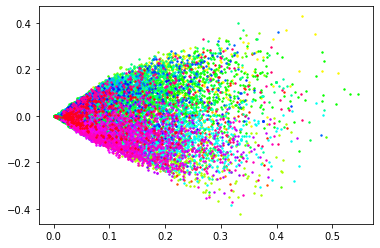

In [27]:
cluster_lables = list(set(y_kmeans))
def get_cmap(n, name='hsv'):
    '''Returns a function that maps each index in 0, 1, ..., n-1 to a distinct
    RGB color; the keyword argument name must be a standard mpl colormap name.'''
    return plt.cm.get_cmap(name, n)
cmap = get_cmap(len(cluster_lables))
for i in range(len(cluster_lables)):
    plt.scatter(matrix_transformed[y_kmeans==cluster_lables[i], 0],
                matrix_transformed[y_kmeans==cluster_lables[i], 1],
                s=2, c=cmap(i), label =str(cluster_lables[i]))

## assess the k-mean algorithm
https://scikit-learn.org/stable/modules/generated/sklearn.metrics.adjusted_rand_score.html

in order to use rand index score, one has to have true labels, which I do not have. So I will just eyeball the results.

https://stackoverflow.com/questions/37842165/sklearn-calculating-accuracy-score-of-k-means-on-the-test-data-set

In terms of evaluating accuracy. You should remember that k-means is not a classification tool, thus analyzing accuracy is not a very good idea. You can do this, but this is not what k-means is for. It is supposed to find a grouping of data which maximizes between-clusters distances, it does not use your labeling to train. Consequently, things like k-means are usually tested with things like RandIndex and other clustering metrics. For maximization of accuracy you should fit actual classifier, like kNN, logistic regression, SVM, etc.

# Fuzzy C Means
use the transform matrix from truncated svd

https://www.kaggle.com/prateekk94/fuzzy-c-means-clustering-on-iris-dataset


In [10]:
# https://scikit-fuzzy.readthedocs.io/en/latest/auto_examples/plot_cmeans.html
# https://github.com/scikit-fuzzy/scikit-fuzzy/blob/master/skfuzzy/cluster/_cmeans.py
def get_cmap(n, name='hsv'):
    '''Returns a function that maps each index in 0, 1, ..., n-1 to a distinct
    RGB color; the keyword argument name must be a standard mpl colormap name.'''
    return plt.cm.get_cmap(name, n)

## graph clusters according to different number of centers (in group of six per page)

In [11]:
# define groups of six for number of centers
groups_of_six_start = (11, 17, 23, 29, 35, 41, 47)
groups_of_six_end = (16, 22, 28, 34, 40, 46, 52)

100%|██████████| 6/6 [00:02<00:00,  2.30it/s]


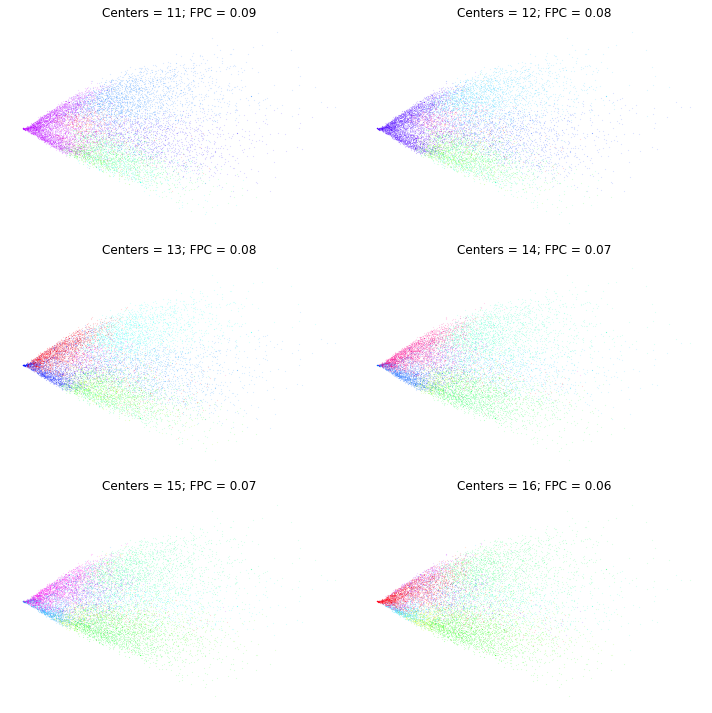

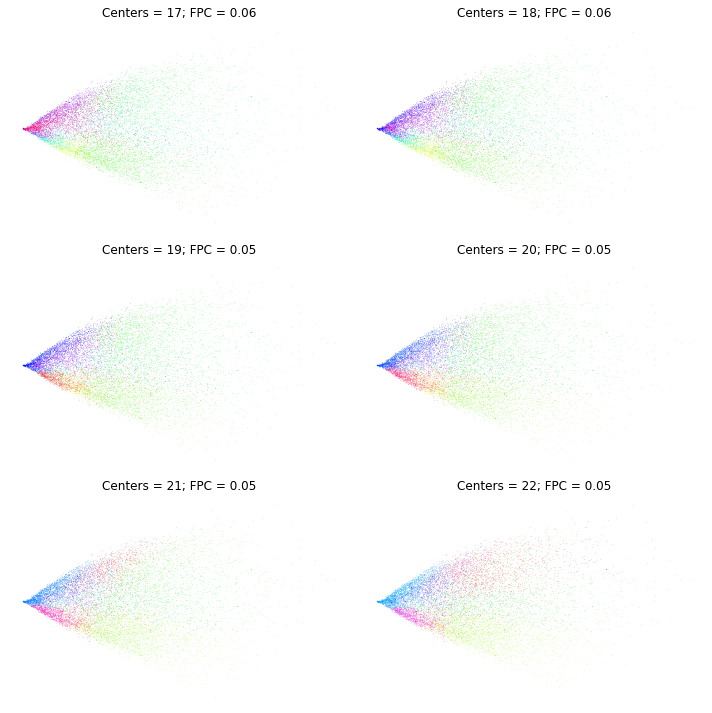

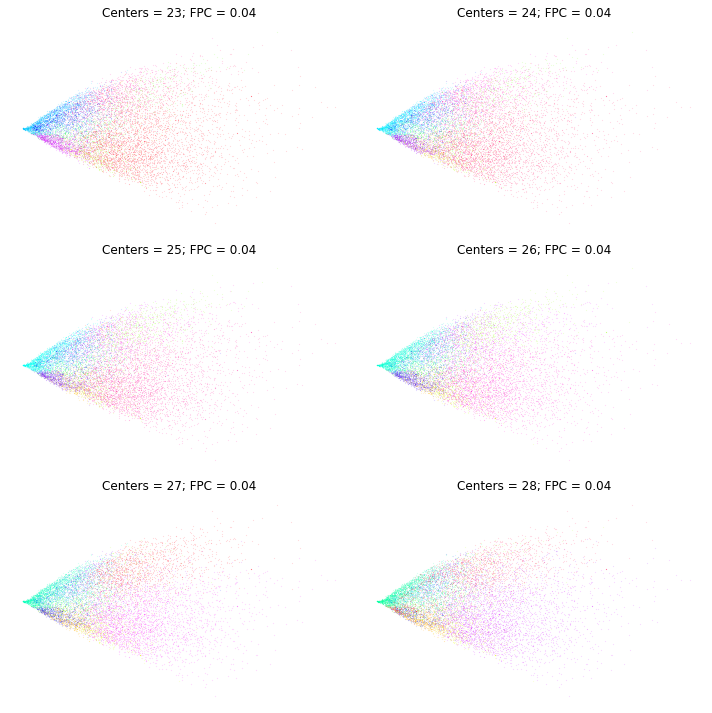

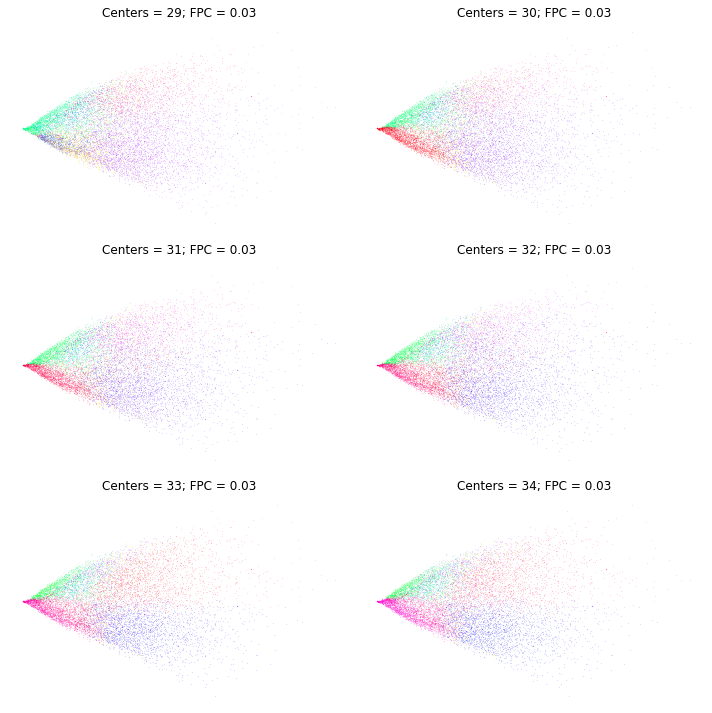

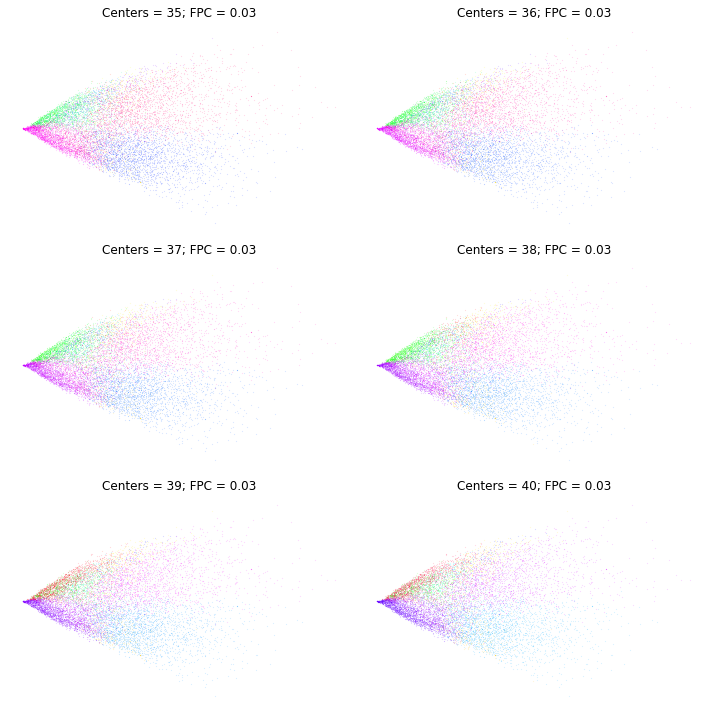

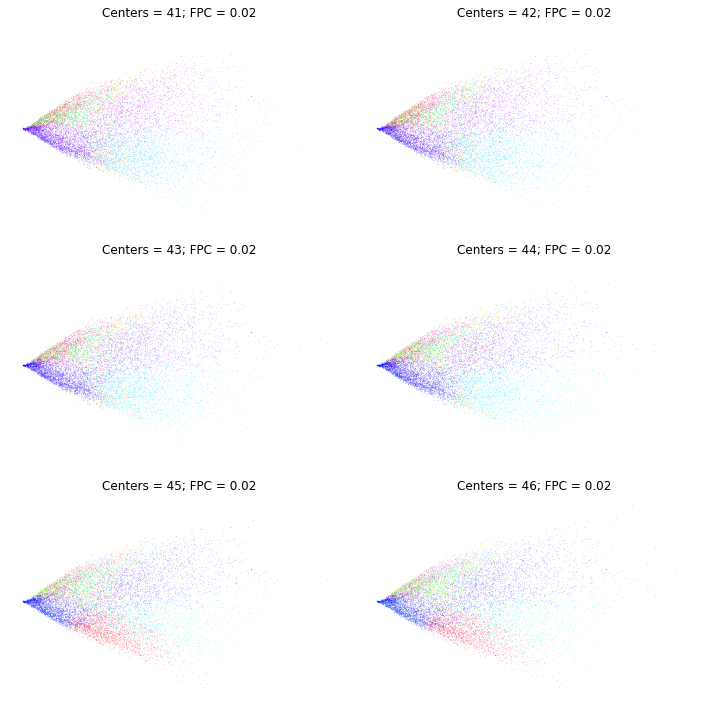

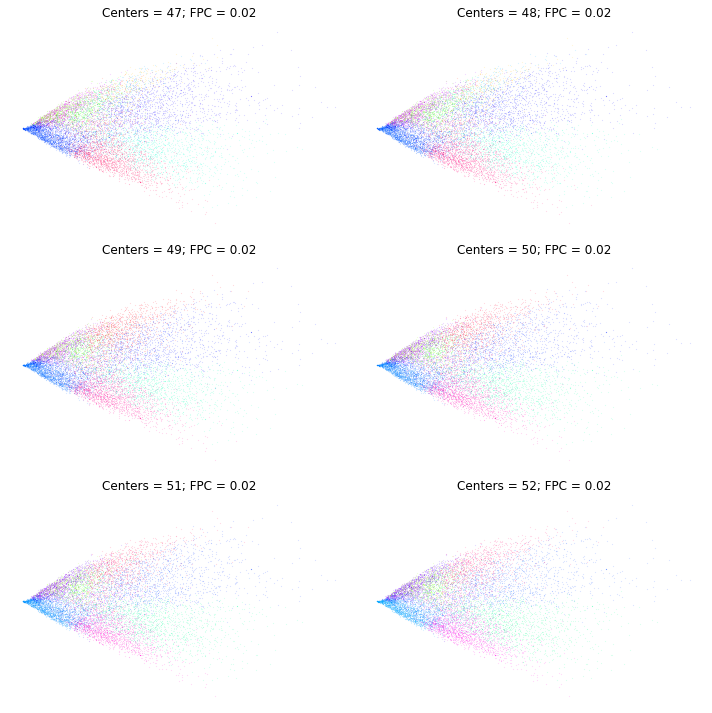

In [12]:
fpcs = []

for z in range(len(groups_of_six_start)):
    fig1, axes1 = plt.subplots(3, 2, figsize=(10,10))
    for ncenters, ax in tqdm(enumerate(axes1.reshape(-1), groups_of_six_start[z]), total=6):
        # Now trying to reshape with (-1) . it returns a flat numpy array
        # second argument means the enumerate index starts at 10
        cmap = get_cmap(ncenters)
        cntr, u, u0, d, jm, p, fpc = fuzz.cluster.cmeans(
            matrix_transformed_T, ncenters, 2, error=0.005, maxiter=500, seed=0)
        # Store fpc values for later
        fpcs.append(fpc)

        # Plot assigned clusters, for each data point in training set
        cluster_membership = np.argmax(u, axis=0)
        for j in range(ncenters):
            ax.plot(matrix_transformed_T[0, cluster_membership == j], # x-axis: feature no.1 is the first row
                    matrix_transformed_T[1, cluster_membership == j], # y-axis: feature no.2 is the second row
                    '.', markersize = 0.1, color=cmap(j))

        # Mark the center of each fuzzy cluster
        # for pt in cntr:
        #     ax.plot(pt[0], pt[1], 'rs')

        ax.set_title('Centers = {0}; FPC = {1:.2f}'.format(ncenters, fpc))
        ax.axis('off')

    # save
    initial_panel = '201908'
    folder_name = initial_panel + '_PANEL_DF'
    f_name = 'fuzzy_c_means_clusters_' + str(groups_of_six_start[z]) + '_' + str(groups_of_six_end[z]) + '.pdf'
    q = input_path / '__PANELS__' / folder_name / 'NLP_graphs'/ f_name
    fig1.savefig(q)
    fig1.tight_layout()


## Fuzzy Partition Coefficient (FPC)
https://pythonhosted.org/scikit-fuzzy/auto_examples/plot_cmeans.html#example-plot-cmeans-py

The FPC is defined on the range from 0 to 1, with 1 being best. It is a metric which tells us how cleanly our data is described by a certain model. Next we will cluster our set of data - which we know has three clusters - several times, with between 2 and 9 clusters. We will then show the results of the clustering, and plot the fuzzy partition coefficient. When the FPC is maximized, our data is described best.

Text(0, 0.5, 'Fuzzy partition coefficient')

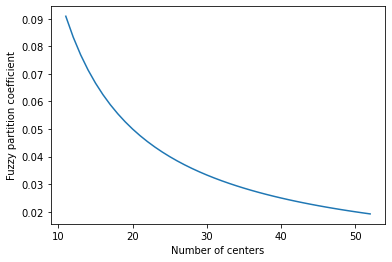

In [8]:
fig2, ax2 = plt.subplots()
ax2.plot(np.r_[11:53], fpcs)
ax2.set_xlabel("Number of centers")
ax2.set_ylabel("Fuzzy partition coefficient")

## look at the probability of a data point belonging to a cluster

np.argmax Returns the indices of the maximum values along an axis.
Here is the maximum probability.
Axis = 0 代表 going down the rows, 就比如第一个 column, 代表一个数据点 (an app's description),
第一列的每一行代表这个数据点 belong to this cluster 的 probability,
argmax return the INDEX of the maximum probability. Row index number 同时对应 cluster's numerical label.

In [13]:
print(u.shape)
print(u)
cluster_membership = np.argmax(u, axis=0)
print(len(cluster_membership))
print(cluster_membership)
# check
# for i in range(len(cluster_membership)):
#     print(u[cluster_membership[i], i])

(52, 11945)
[[0.01923076 0.01923078 0.01923076 ... 0.01923075 0.01923076 0.01923076]
 [0.01923083 0.01923074 0.01923079 ... 0.01923077 0.01923078 0.01923074]
 [0.0192308  0.01923076 0.01923078 ... 0.01923077 0.01923077 0.01923076]
 ...
 [0.01923076 0.01923079 0.01923076 ... 0.01923078 0.01923076 0.01923078]
 [0.01923074 0.01923079 0.01923077 ... 0.01923078 0.01923077 0.01923079]
 [0.01923076 0.01923077 0.01923078 ... 0.01923078 0.01923077 0.01923079]]
11945
[38 22 32 ... 32 32 22]


我们感兴趣的是一个数据点是否在很多个 cluster 里面都有较高的 probability, 这样的数据点就可以被定义为 broad app. 反之，
当一个数据点只有在一个 cluster 里面的概率超高，在其他 cluster 里面的概率超低，它就可以被定义为 niche product.
在两个极端之间的就是中间类产品，这个应该是一个 continuous 的 scale. 现在需要验证一下我的想法。 既然没一列的数据就是一个产品在各个 cluster 的概率，
我们只需要一个 measure of concentration of the data 就可以了。

1. variance: niche product tend to have higher variance while the broad product tend to have lower variance
because of the probabilities are more or less equal across clusters.

In [14]:
# use variance
# high variance, niche product; low variance, broad product
u_var = np.var(u, axis=0)
print(u_var.shape)
print(u_var)

(11945,)
[3.07787679e-15 1.37710295e-15 8.37317648e-16 ... 1.11765356e-15
 7.44916785e-16 1.72349133e-15]


match the columns to app ids

In [15]:
u_var
app_ids = matrix_transformed_df.index.tolist()
predicted_cluster_app_ids = merge_lists_to_dataframe(appid = app_ids,
                                                     cluster_label = u_var,
                                                     type_of_cluster = 'fuzzy c means var of membership scores')
print(predicted_cluster_app_ids.shape)
predicted_cluster_app_ids

(11945, 1)


,fuzzy c means var of membership scores
app_id,
com.canva.editor,3.077877e-15
jp.ne.ibis.ibispaintx.app,1.377103e-15
com.adobe.spark.post,8.373176e-16
com.sec.penup,2.100527e-15
com.doodle.master.draw.glow.art,1.293700e-15
...,...
com.sparklingsocietytycoon.paradisecityislandsim,3.894698e-16
com.budgestudios.MyLittlePonyHarmonyQuest,5.335861e-16
com.budgestudios.googleplay.MyLittlePonyRainbowRunners,1.117654e-15


In [17]:
df2 = add_cluster_label_to_df(open_file_func = open_topic_df,
    initial_panel = '201908', merged_df = predicted_cluster_app_ids)
df2.sample(n=1)

,description_201908,description_201912,description_202001,description_202003,description_202004,description_202009,description_202010,description_202011,combined_panels_description,topic_words,fuzzy c means var of membership scores
com.garzotto.smma,[available],"[swiss, map, mobile, bring, swiss, national, map, 1:10, 000, 1:25, 000, 1:50, 000, 1:100, 000, 1:500, 000, 1:1, million, smartphone, tablet.\nthe, important, function, seamless, zooming, change, scale, position, gps, include, move, map, recording, waypoint, routes.\nswiss, map, mobile, offer, free, unlimited, access, simple, possibility, download, local, storage, predefine, map, extent, area, 10x10, km, offline, usage, swiss, map, mobile, subscription, store, map, material, depend, available, free, space, device, subscription, year, purchase, application, directly, information, swiss, map, mobile, gather, swisstopo.\nnote, application, require, internet, connection, order, download, map, material, connection, establish, wi, fi, mobile, network, startup, stored, map, datum, automatically, update, long, wi, fi, ...]","[swiss, map, mobile, bring, swiss, national, map, 1:10, 000, 1:25, 000, 1:50, 000, 1:100, 000, 1:500, 000, 1:1, million, smartphone, tablet.\nthe, important, function, seamless, zooming, change, scale, position, gps, include, move, map, recording, waypoint, routes.\nswiss, map, mobile, offer, free, unlimited, access, simple, possibility, download, local, storage, predefine, map, extent, area, 10x10, km, offline, usage, swiss, map, mobile, subscription, store, map, material, depend, available, free, space, device, subscription, year, purchase, application, directly, information, swiss, map, mobile, gather, swisstopo.\nnote, application, require, internet, connection, order, download, map, material, connection, establish, wi, fi, mobile, network, startup, stored, map, datum, automatically, update, long, wi, fi, ...]","[swiss, map, mobile, bring, swiss, national, map, 1:10, 000, 1:25, 000, 1:50, 000, 1:100, 000, 1:500, 000, 1:1, million, smartphone, tablet, important, function, seamless, zooming, change, scale, position, gps, include, move, map, recording, waypoint, route, swiss, map, mobile, offer, free, unlimited, access, simple, possibility, download, local, storage, predefine, map, extent, area, 10x10, km, offline, usage, swiss, map, mobile, subscription, store, map, material, depend, available, free, space, device, subscription, year, purchase, application, directly, information, swiss, map, mobile, gather, swisstopo, note, application, require, internet, connection, order, download, map, material, connection, establish, wi, fi, mobile, network, startup, stored, map, datum, automatically, update, long, ...]","[swiss, map, mobile, bring, swiss, national, map, 1:10, 000, 1:25, 000, 1:50, 000, 1:100, 000, 1:500, 000, 1:1, million, smartphone, tablet, important, function, seamless, zooming, change, scale, position, gps, include, move, map, recording, waypoint, route, swiss, map, mobile, offer, free, unlimited, access, simple, possibility, download, local, storage, predefine, map, extent, area, 10x10, km, offline, usage, swiss, map, mobile, subscription, store, map, material, depend, available, free, space, device, subscription, year, purchase, application, directly, information, swiss, map, mobile, gather, swisstopo, note, application, require, internet, connection, order, download, map, material, connection, establish, wi, fi, mobile, network, startup, stored, map, datum, automatically, update, long, ...]","[swiss, map, mobile, bring, swiss, national, map, 1:10, 000, 1:25, 000, 1:50, 000, 1:100, 000, 1:500, 000, 1:1, million, smartphone, tablet, important, function, seamless, zooming, change, scale, position, gps, include, move, map, recording, waypoint, route, swiss, map, mobile, offer, free, unlimited, access, simple, possibility, download, local, storage, predefine, map, extent, area, 10x10, km, offline, usage, swiss, map, mobile, subscription, store, map

In [18]:
# sort the dataframe variance of membership scores of 52 clusters from low to high, the lowest
# variance indicates the app share relatively the same membership in all groups, which means the app
# is a broad app instead of a niche app.
df2 = df2.sort_values(by=['fuzzy c means var of membership scores'])
top_broad_apps = df2.iloc[:10]
print('top_broad_apps')
print(top_broad_apps)

top_apps
                                   description_201908  \
com.usbmis.troposphere.nursedhb2          [available]   
com.trellisys.sas                         [available]   
com.ubisoft.horsehaven.adventures         [available]   
com.izy318.filmfilmfilm                   [available]   
com.mediocre.sprinkle2                    [available]   
com.dustflake.innergarden.japanese        [available]   
org.gml.fantasydraftlottery               [available]   
com.quoord.tapatalkHD                     [available]   
com.easy8.cardshark                       [available]   
air.net.veronasolutions.BuoyData          [available]   

                                                                                                                                                                                                                                                                                                                                                                           

In [21]:
df2 = df2.sort_values(by=['fuzzy c means var of membership scores'], ascending=False)
top_niche_apps = df2.iloc[:10]
print('top_niche_apps')
print(top_niche_apps)

top_niche_apps
                                      description_201908  \
com.wasafat.tabiia.lijamalik                 [available]   
studio.wonlex.stepbystep                     [available]   
com.hilton.android.hhonors                   [available]   
com.qidian.QDReader.traditional              [available]   
org.contentarcade.apps.nutribullet           [available]   
aa.apps.pro.dailyreflections                 [available]   
com.tomdxs.symafpv                           [available]   
com.test.e30mTestappDF_04                    [available]   
com.cookpad.android.activities               [available]   
com.ahmedelshazly2020d.sales_managers        [available]   

                                                                                                                                                                                                                                                                                                                                    

# key function documentation

In [ ]:
# https://github.com/scikit-fuzzy/scikit-fuzzy/blob/master/skfuzzy/cluster/_cmeans.py
def cmeans(data, c, m, error, maxiter,
           metric='euclidean',
           init=None, seed=None):
    """
    Fuzzy c-means clustering algorithm [1].
    Parameters
    ----------
    data : 2d array, size (S, N)
        Data to be clustered.  N is the number of data sets; S is the number
        of features within each sample vector.
        ## NAIXIN: BEAWARE, this is different from kmeans, where S is the number of data points and N is the number of features.
    c : int
        Desired number of clusters or classes.
    m : float
        Array exponentiation applied to the membership function u_old at each
        iteration, where U_new = u_old ** m.
    error : float
        Stopping criterion; stop early if the norm of (u[p] - u[p-1]) < error.
    maxiter : int
        Maximum number of iterations allowed.
    metric: string
        By default is set to euclidean. Passes any option accepted by
        ``scipy.spatial.distance.cdist``.
    init : 2d array, size (c, N)
        Initial fuzzy c-partitioned matrix. If none provided, algorithm is
        randomly initialized.
    seed : int
        If provided, sets random seed of init. No effect if init is
        provided. Mainly for debug/testing purposes.
    Returns
    -------
    cntr : 2d array, size (c, S)
        Cluster centers.  Data for each center along each feature provided
        for every cluster (of the `c` requested clusters).
    u : 2d array, (c, N)
        Final fuzzy c-partitioned matrix.
    u0 : 2d array, (c, N)
        Initial guess at fuzzy c-partitioned matrix (either provided init or
        random guess used if init was not provided).
    d : 2d array, (c, N)
        Final Euclidian distance matrix.
    jm : 1d array, length P
        Objective function history.
    p : int
        Number of iterations run.
    fpc : float
        Final fuzzy partition coefficient.
    Notes
    -----
    The algorithm implemented is from Ross et al. [1]_.
    Fuzzy C-Means has a known problem with high dimensionality datasets, where
    the majority of cluster centers are pulled into the overall center of
    gravity. If you are clustering data with very high dimensionality and
    encounter this issue, another clustering method may be required. For more
    information and the theory behind this, see Winkler et al. [2]_.
    References
    ----------
    .. [1] Ross, Timothy J. Fuzzy Logic With Engineering Applications, 3rd ed.
           Wiley. 2010. ISBN 978-0-470-74376-8 pp 352-353, eq 10.28 - 10.35.
    .. [2] Winkler, R., Klawonn, F., & Kruse, R. Fuzzy c-means in high
           dimensional spaces. 2012. Contemporary Theory and Pragmatic
           Approaches in Fuzzy Computing Utilization, 1.
    """


# extra stuff
https://bl.ocks.org/rpgove/0060ff3b656618e9136b

Then, plot a line chart of the SSE for each value of k. If the line chart looks like an arm, then the "elbow" on the arm is the value of k that is the best.

However, the elbow method doesn't always work well; especially if the data is not very clustered. Notice how the elbow chart for Dataset B does not have a clear elbow. Instead, we see a fairly smooth curve, and it's unclear what is the best value of k to choose. In cases like this, we might try a different method for determining the optimal k, such as computing silhouette scores, or we might reevaluate whether clustering is the right thing to do on our data.

### kmeans silhouette analysis

https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html

In [ ]:
# source code for fit_transform of TruncatedSVD
# https://github.com/scikit-learn/scikit-learn/blob/0fb307bf3/sklearn/decomposition/_truncated_svd.py#L24
# https://github.com/scipy/scipy/blob/v1.5.4/scipy/sparse/linalg/eigen/arpack/arpack.py#L1724-L1910
# below are functions within class TruncatedSVD

def __init__(self, n_components=2, *, algorithm="randomized", n_iter=5,
             random_state=None, tol=0.):
    self.algorithm = algorithm
    self.n_components = n_components
    self.n_iter = n_iter
    self.random_state = random_state
    self.tol = tol

def fit_transform(self, X, y=None):
    """Fit LSI model to X and perform dimensionality reduction on X.
    Parameters
    ----------
    X : {array-like, sparse matrix}, shape (n_samples, n_features)
        Training data.
    y : Ignored
    Returns
    -------
    X_new : array, shape (n_samples, n_components)
        Reduced version of X. This will always be a dense array.
    """
    X = self._validate_data(X, accept_sparse=['csr', 'csc'],
                            ensure_min_features=2)
    random_state = check_random_state(self.random_state)

    if self.algorithm == "arpack":
        U, Sigma, VT = svds(X, k=self.n_components, tol=self.tol)
        # svds doesn't abide by scipy.linalg.svd/randomized_svd
        # conventions, so reverse its outputs.
        Sigma = Sigma[::-1]
        U, VT = svd_flip(U[:, ::-1], VT[::-1])

    elif self.algorithm == "randomized":
        k = self.n_components
        n_features = X.shape[1]
        if k >= n_features:
            raise ValueError("n_components must be < n_features;"
                             " got %d >= %d" % (k, n_features))
        U, Sigma, VT = randomized_svd(X, self.n_components,
                                      n_iter=self.n_iter,
                                      random_state=random_state)
    else:
        raise ValueError("unknown algorithm %r" % self.algorithm)

    self.components_ = VT

    # Calculate explained variance & explained variance ratio
    X_transformed = U * Sigma
    self.explained_variance_ = exp_var = np.var(X_transformed, axis=0)
    if sp.issparse(X):
        _, full_var = mean_variance_axis(X, axis=0)
        full_var = full_var.sum()
    else:
        full_var = np.var(X, axis=0).sum()
    self.explained_variance_ratio_ = exp_var / full_var
    self.singular_values_ = Sigma  # Store the singular values.

    return X_transformed